In [1]:
import rapids_singlecell as rsc

## **Import Packages for GPU-based**

In [2]:
import scanpy as sc 
import pandas as pd
import seaborn as sns
import numpy as np
from scipy.stats import median_abs_deviation
import os
import warnings
warnings.filterwarnings('ignore', 'Expected')
warnings.simplefilter('ignore')

import scipy.sparse as sp
import anndata 
from anndata import AnnData
import matplotlib

import time
import cuda
import cudf
import cupy

from cuml.decomposition import PCA
from cuml.manifold import TSNE
from cuml.cluster import KMeans
from cuml.preprocessing import StandardScaler



In [3]:
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator

rmm.reinitialize(
    managed_memory=True,
)

cupy.cuda.set_allocator(rmm_cupy_allocator)

In [128]:
print(sc.__dir__())

['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__path__', '__file__', '__cached__', '__builtins__', '_version', '__version__', 'logging', '_settings', '_utils', '_compat', 'settings', 'Verbosity', 'get', 'neighbors', 'preprocessing', 'readwrite', 'tools', 'tl', 'pp', 'plotting', 'pl', 'datasets', 'queries', 'external', 'metrics', 'experimental', 'AnnData', 'concat', 'read_h5ad', 'read_csv', 'read_excel', 'read_hdf', 'read_loom', 'read_mtx', 'read_text', 'read_umi_tools', 'read', 'read_10x_h5', 'read_10x_mtx', 'write', 'read_visium', 'Neighbors', 'set_figure_params']


In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

2024-05-31 20:25:42.136055: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-31 20:25:42.181736: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 20:25:42.181772: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 20:25:42.182592: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-31 20:25:42.190093: I tensorflow/core/platform/cpu_feature_guar

scanpy==1.9.8 anndata==0.10.6 umap==0.5.5 numpy==1.24.4 scipy==1.12.0 pandas==1.5.3 scikit-learn==1.4.1.post1 statsmodels==0.14.1 pynndescent==0.5.11


In [5]:
results_file = "/home/supakorn/rscript/results/GSE178265_DA_neurons/GSE178265_results.h5ad"

### Read h5ad file or MTX, Feature and Barcode files from GEO

In [11]:
matrix = '/home/supakorn/rscript/dataset/GSE178265_DA_neurons/GSE178265_Homo_matrix.mtx.gz'
feature = '/home/supakorn/rscript/dataset/GSE178265_DA_neurons/GSE178265_Homo_features.tsv.gz'
barcode = '/home/supakorn/rscript/dataset/GSE178265_DA_neurons/GSE178265_Homo_bcd.tsv.gz'

In [12]:
adata = sc.read_mtx(matrix)

In [13]:
adata_bc = pd.read_csv(barcode, header=None)
adata_feature = pd.read_csv(feature, header=None)

In [14]:
adata_bc

,0
0,pPDCN4340DAPIA030419_AATGCCACACAAGCAG-1
1,pPDCN4340DAPIA030419_AGACTCAGTCACAATC-1
2,pPDCN4340DAPIA030419_ATACTTCCAGCGTTGC-1
3,pPDCN4340DAPIA030419_ATATCCTGTGTGTTTG-1
4,pPDCN4340DAPIA030419_ATCCACCGTGGGTTGA-1
...,...
434335,pPDsHSrSNxi3298d200429PosB_CATACTTGTCTGATCA-1
434336,pPDsHSrSNxi3298d200429PosB_TTTGTTGTCCTTGAAG-1
434337,pPDsHSrSNxi3298d200429PosB_ACACTGACACTAGAGG-1
434338,pPDsHSrSNxi3298d200429PosB_CAACAACAGCTCGAAG-1


In [15]:
adata_feature

,0
0,RP11-34P13.3\tRP11-34P13.3\tGene Expression
1,FAM138A\tFAM138A\tGene Expression
2,OR4F5\tOR4F5\tGene Expression
3,RP11-34P13.7\tRP11-34P13.7\tGene Expression
4,RP11-34P13.8\tRP11-34P13.8\tGene Expression
...,...
41620,RN7SL739P\tRN7SL739P\tGene Expression
41621,MIR4502\tMIR4502\tGene Expression
41622,RNU4-10P\tRNU4-10P\tGene Expression
41623,RN7SL865P\tRN7SL865P\tGene Expression


In [16]:
adata_bc[['Patient', 'Barcode']] = adata_bc[0].str.split('_', expand=True)
adata_bc.drop(columns=[0], inplace=True)
adata_bc

,Patient,Barcode
0,pPDCN4340DAPIA030419,AATGCCACACAAGCAG-1
1,pPDCN4340DAPIA030419,AGACTCAGTCACAATC-1
2,pPDCN4340DAPIA030419,ATACTTCCAGCGTTGC-1
3,pPDCN4340DAPIA030419,ATATCCTGTGTGTTTG-1
4,pPDCN4340DAPIA030419,ATCCACCGTGGGTTGA-1
...,...,...
434335,pPDsHSrSNxi3298d200429PosB,CATACTTGTCTGATCA-1
434336,pPDsHSrSNxi3298d200429PosB,TTTGTTGTCCTTGAAG-1
434337,pPDsHSrSNxi3298d200429PosB,ACACTGACACTAGAGG-1
434338,pPDsHSrSNxi3298d200429PosB,CAACAACAGCTCGAAG-1


# **READ CSV HERE!!**

In [17]:
csv = pd.read_csv('/home/supakorn/rscript/dataset/GSE178265_DA_neurons/GSE178265_data.csv')
csv = csv.rename(columns={"Title" : "Patient"})
csv.sort_values('age')

,Unnamed: 0,ID,Patient,OrganismName,OwnerName,OwnerEmail,Model,Package,Status,source_name,tissue,Sex,age,pmi,disease,status,Cause of death,facs classification,10x version,genome build
80,80,SAMN19715216,pPDsRatrSNxixd200314x,Rattus norvegicus,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Rat Substantia nigra pars compacta,Substantia nigra pars compacta,male,0.2,NaN,NaN,NaN,NaN,Positive,V3,Rnor_6.0
81,81,SAMN19715215,pPDsMMrSNxiNIH1d200516DAPI,Macaca mulatta,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Rhesus Macaque Substantia nigra pars compacta,Substantia nigra pars compacta,male,3.0,NaN,NaN,NaN,NaN,Negative,V3,Mmul_10
75,75,SAMN19715221,pPDsMMrSNxiNIH1d200516Nurr,Macaca mulatta,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Rhesus Macaque Substantia nigra pars compacta,Substantia nigra pars compacta,male,3.0,NaN,NaN,NaN,NaN,Positive,V3,Mmul_10
79,79,SAMN19715217,pPDsTreeShrewrSNxixd200314x,Tupaia belangeri,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Tree Shrew Substantia nigra pars compacta,Substantia nigra pars compacta,male,3.0,NaN,NaN,NaN,NaN,Positive,V3,tupBel1
27,27,SAMN19715292,pPDCN5730NeuN22119,Homo sapiens,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Human Caudate nucleus,Substantia nigra pars compacta,male,25.0,33.75,Ctrl,Ctrl,"Seizure disorder,congenital heart disease",NeuN,V3,hg19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,93,SAMN19715171,pPDsHSrSNxi3346d200429PosA,Homo sapiens,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Human Substantia nigra pars compacta,Substantia nigra pars compacta,female,91.0,10.00,Ctrl,Ctrl,Congestive Heart failure,Positive,V3,hg19
8,8,SAMN19715311,pPDsHSrSNxi4956d200429PosB,Homo sapiens,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Human Substantia nigra pars compacta,Substantia nigra pars compacta,female,92.0,23.30,Ctrl,Ctrl,Prostate cancer,Positive,V3,hg19
97,97,SAMN19715164,pPDsHSrSNxi4956d200429PosA,Homo sapiens,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Human Substantia nigra pars compacta,Substantia nigra pars compacta,female,92.0,23.30,Ctrl,Ctrl,Prostate cancer,Positive,V3,hg19
73,73,SAMN19715223,pPDsHSrSNxi4956d200429DAPIA,Homo sapiens,Broad Institute,emacosko@broadinstitute.org,Generic,Generic,live,Human Substantia nigra pars compacta,Substantia nigra pars compacta,female,92.0,23.30,Ctrl,Ctrl,Prostate cancer,Negative,V3,hg19


In [18]:
adata_merge_patient = adata_bc.merge(csv, on='Patient')

In [19]:
list_patient = list(dict.fromkeys(adata_merge_patient['age']))
print(len(list_patient))
print(list_patient)

16
[47.0, 79.0, 91.0, 76.0, 49.0, 90.0, 59.0, 82.0, 92.0, 75.0, 89.0, 83.0, 70.0, 78.0, 25.0, 74.0]


In [20]:
adata_feature[['Gene_symbol', 'gene_ids', 'Expression']] = adata_feature[0].str.split('\t', expand=True)
adata_feature.drop(columns=[0], inplace=True)
adata_feature

,Gene_symbol,gene_ids,Expression
0,RP11-34P13.3,RP11-34P13.3,Gene Expression
1,FAM138A,FAM138A,Gene Expression
2,OR4F5,OR4F5,Gene Expression
3,RP11-34P13.7,RP11-34P13.7,Gene Expression
4,RP11-34P13.8,RP11-34P13.8,Gene Expression
...,...,...,...
41620,RN7SL739P,RN7SL739P,Gene Expression
41621,MIR4502,MIR4502,Gene Expression
41622,RNU4-10P,RNU4-10P,Gene Expression
41623,RN7SL865P,RN7SL865P,Gene Expression


In [21]:
# Transpose adata_mtx
# Now, sc_Matrix = Cells/Barcode (rows) x Genes (columns)
adata = adata.T
adata.X

<434340x41625 sparse matrix of type '<class 'numpy.float32'>'
	with 1654688953 stored elements in Compressed Sparse Column format>

In [22]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625

In [23]:
# Assign Variable (var) and Observation (obs) to Anndata from barcode.tsv and feature.tsv

adata.var_names = adata_feature['gene_ids']
adata.obs_names = adata_merge_patient['Barcode']

In [24]:
adata.var

""
gene_ids
RP11-34P13.3
FAM138A
OR4F5
RP11-34P13.7
RP11-34P13.8
...
RN7SL739P
MIR4502
RNU4-10P


In [25]:
adata.obs

""
Barcode
AATGCCACACAAGCAG-1
AGACTCAGTCACAATC-1
ATACTTCCAGCGTTGC-1
ATATCCTGTGTGTTTG-1
ATCCACCGTGGGTTGA-1
...
CATACTTGTCTGATCA-1
TTTGTTGTCCTTGAAG-1
ACACTGACACTAGAGG-1


In [26]:
adata.obs['Patient'] = adata_merge_patient['Patient'].values
adata.obs['Conditions'] = adata_merge_patient['status'].values
adata.obs['age'] = adata_merge_patient['age'].values
adata.obs['sex'] = adata_merge_patient['Sex'].values
adata.var['gene_ids'] = adata_feature['gene_ids'].values

In [27]:
adata.X

<434340x41625 sparse matrix of type '<class 'numpy.float32'>'
	with 1654688953 stored elements in Compressed Sparse Column format>

In [28]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625
    obs: 'Patient', 'Conditions', 'age', 'sex'
    var: 'gene_ids'

In [29]:
mat = adata.X.todense()

In [30]:
mat.shape

(434340, 41625)

In [31]:
gene = adata.var.index.tolist()
cell = adata.obs.index.tolist()

In [32]:
adata_df = pd.DataFrame(mat, columns=gene, index=cell)
adata_df

,RP11-34P13.3,FAM138A,OR4F5,RP11-34P13.7,RP11-34P13.8,RP11-34P13.14,RP11-34P13.9,FO538757.3,FO538757.2,AP006222.2,...,RNU2-71P,RNA5SP252,AC116533.2,AC114494.1,RN7SL424P,RN7SL739P,MIR4502,RNU4-10P,RN7SL865P,RNU6-191P
AATGCCACACAAGCAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGACTCAGTCACAATC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATACTTCCAGCGTTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATATCCTGTGTGTTTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATCCACCGTGGGTTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CATACTTGTCTGATCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCCTTGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACACTGACACTAGAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CAACAACAGCTCGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
adata_df.transpose()

,AATGCCACACAAGCAG-1,AGACTCAGTCACAATC-1,ATACTTCCAGCGTTGC-1,ATATCCTGTGTGTTTG-1,ATCCACCGTGGGTTGA-1,ATCCGTCGTCACGACC-1,ATCGTAGCAAGCTGCC-1,ATGCCTCTCTGGGATT-1,ATTCCATAGTTTCTTC-1,CACACAACACTATCGA-1,...,TCGTGGGAGATCCCAT-1,TGCTCCAGTGGCTCTG-1,ATGGGTTTCTATCCAT-1,AAGCCATAGGATACCG-1,ATTCTTGTCCGCAAAT-1,CATACTTGTCTGATCA-1,TTTGTTGTCCTTGAAG-1,ACACTGACACTAGAGG-1,CAACAACAGCTCGAAG-1,TGAGCATCAGACAAGC-1
RP11-34P13.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FAM138A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
OR4F5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP11-34P13.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP11-34P13.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RN7SL739P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR4502,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RNU4-10P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RN7SL865P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## **Quality Control and Filtering**

In [29]:
rsc.get.anndata_to_GPU(adata) ## Move adata.X to GPU

In [30]:
#merged_adata.var["mt"] = merged_adata.var_names.str.startswith("MT-")

rsc.pp.flag_gene_family(adata, gene_family_name="mt", gene_family_prefix="MT-")

rsc.pp.calculate_qc_metrics(adata, 
                            qc_vars=["mt"], 
                            log1p=True)

In [31]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625
    obs: 'Patient', 'Conditions', 'age', 'sex', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot QC**

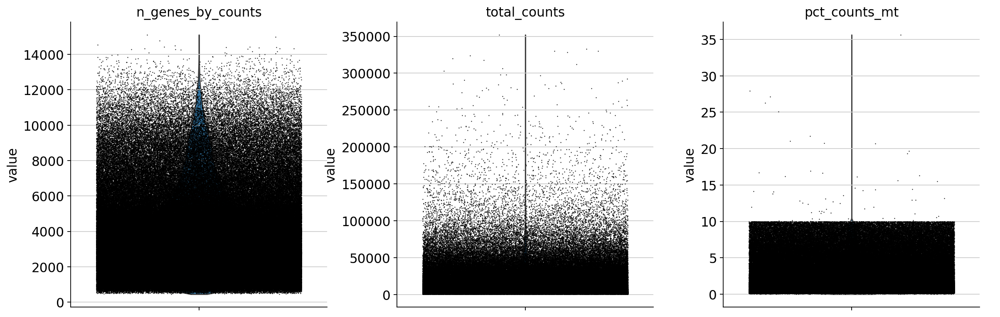

In [32]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True)

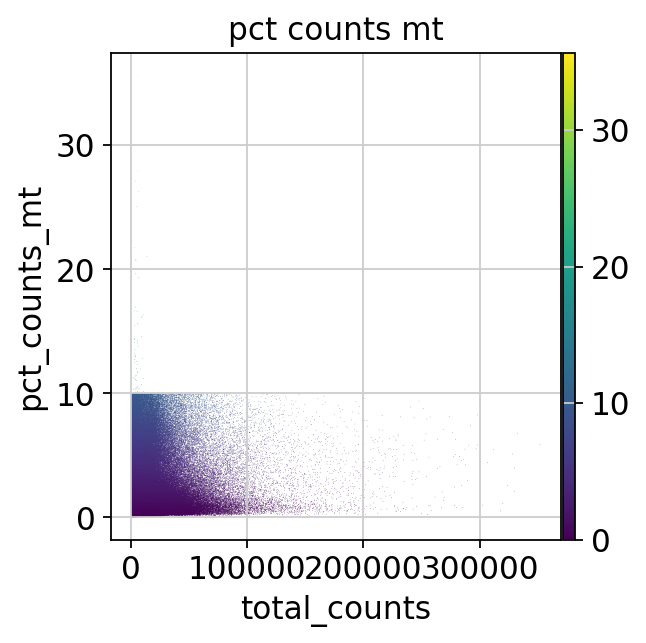

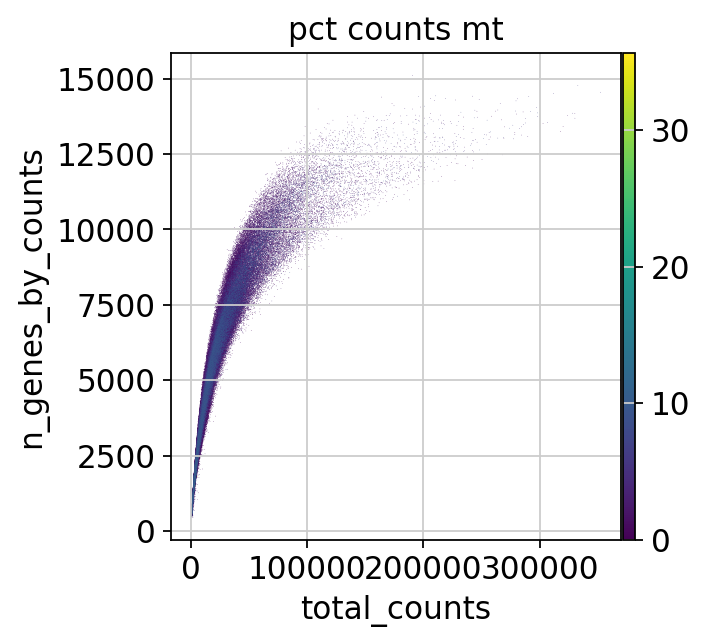

In [33]:
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt", color="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Outlier Threshold**

#### ***MAD = median(|Xi - median(X)|)***
Xi is the respective QC metric of an observation and 
describes a robust statistic of the variability of the metric.
[Germain et al., 2020]

In [168]:
#def is_outlier(merged_adata, metric: str, nmads: int):
#    M = merged_adata.obs[metric]
#    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
#        np.median(M) + nmads * median_abs_deviation(M) < M
#    )
#    return outlier

In [169]:
#merged_adata.obs["outlier"] = (
#    is_outlier(merged_adata, "log1p_total_counts", 5) |
#    is_outlier(merged_adata, "log1p_n_genes_by_counts", 5) #|
#    #is_outlier(merged_adata, "pct_counts_in_top_20_genes", 5)    
#)
#merged_adata.obs.outlier.value_counts()

In [170]:
#merged_adata.obs["mt_outlier"] = is_outlier(merged_adata, "pct_counts_mt", 3) | (
#    merged_adata.obs["pct_counts_mt"] > 20
#)
#merged_adata.obs.mt_outlier.value_counts()

In [171]:
#print(f"Total number of cells: {merged_adata.n_obs}")
#merged_adata = merged_adata[(~merged_adata.obs.outlier) & (~merged_adata.obs.mt_outlier)].copy()
#
#print(f"Number of cells after filtering of low quality cells: {merged_adata.n_obs}")

In [172]:
#sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Filtering**

In [173]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625
    obs: 'patient', 'status', 'age', 'sex', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

In [34]:
#print(f"Total number of genes: {merged_adata.n_vars}")
#rsc.pp.filter_cells(merged_adata, min_count=3)
#rsc.pp.filter_cells(merged_adata, max_count=20000)
#print(f"Number of genes after cell filter: {merged_adata.n_vars}")


adata = adata[adata.obs.pct_counts_mt < 10, :]
adata = adata[adata.obs.n_genes_by_counts < 12000, :]
adata = adata[adata.obs.n_genes_by_counts > 300, :]

In [35]:
rsc.pp.filter_genes(adata, min_count=3)

filtered out 3031 genes based on n_cells_by_counts


In [37]:
adata

AnnData object with n_obs × n_vars = 433137 × 38594
    obs: 'Patient', 'Conditions', 'age', 'sex', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot after filtering**

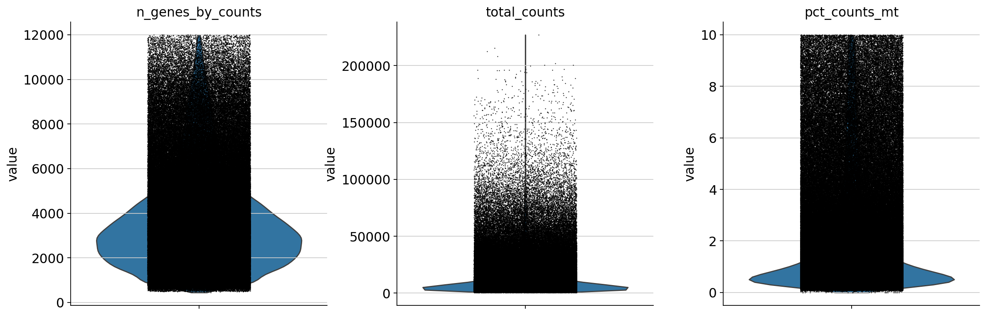

In [38]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.2,
    multi_panel=True)

In [39]:
adata.layers["counts"] = adata.X.copy()
adata.shape

(433137, 38594)

In [40]:
adata.write("/home/supakorn/rscript/results/GSE178265_DA_neurons/GSE178265_no_norm.h5ad")

## **Normalization**

In [179]:
rsc.pp.normalize_total(adata, target_sum=1e4)

In [180]:
rsc.pp.log1p(adata)

In [181]:
rsc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3", layer = "counts")


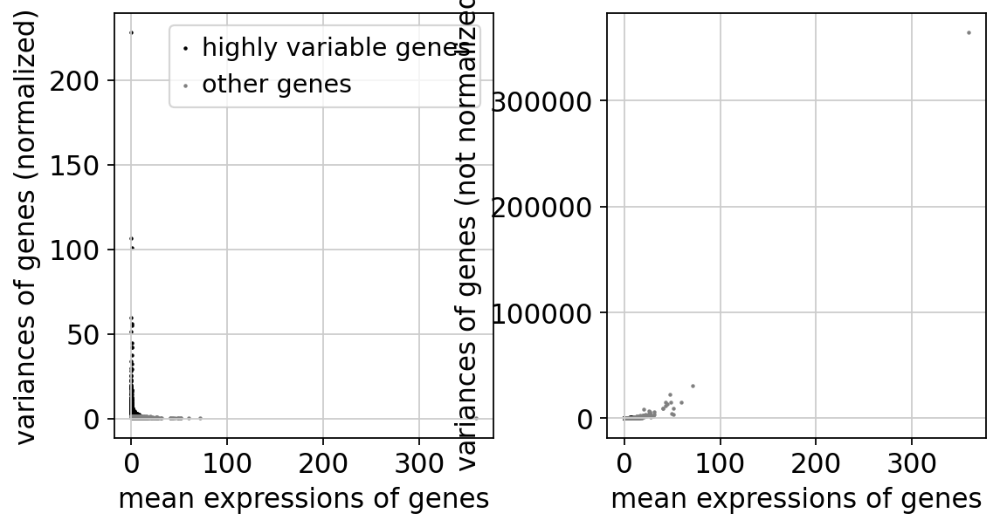

In [182]:
sc.pl.highly_variable_genes(adata)

### Create .raw file

In [183]:
adata.raw = adata

In [184]:
adata = adata[:, adata.var.highly_variable]

## **Regress out unwanted variable**

In [185]:
rsc.pp.regress_out(adata, keys=["total_counts", "pct_counts_mt"])

## **Scale Data**

In [186]:
rsc.pp.scale(adata, max_value=10)

## **Plot PCA**

In [187]:
rsc.pp.pca(adata, n_comps=100)

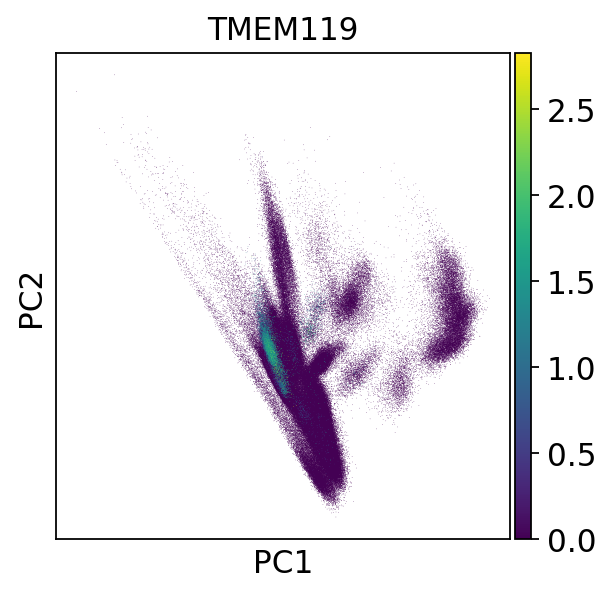

In [188]:
sc.pl.pca(adata, color='TMEM119')

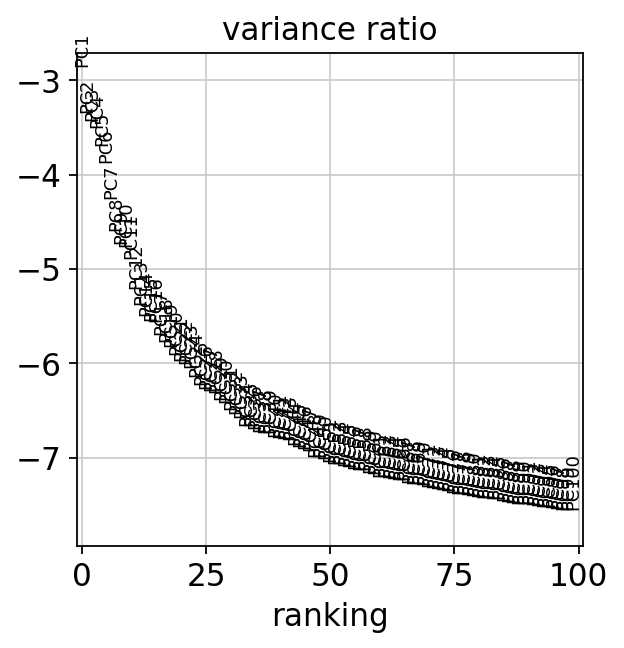

In [189]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

In [190]:
rsc.get.anndata_to_CPU(adata, convert_all=True)

In [191]:
adata

AnnData object with n_obs × n_vars = 433186 × 3000
    obs: 'patient', 'status', 'age', 'sex', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [192]:
adata.write(results_file)

In [193]:
adata_obs_df = pd.DataFrame(adata.obs)

In [194]:
adata_obs_df

,patient,status,age,sex,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt
Barcode,,,,,,,,,,,
AATGCCACACAAGCAG-1,pPDCN4340DAPIA030419,Ctrl,47.0,male,7870,41327.0,8.970940,10.629295,184.0,0.445230,5.220356
AGACTCAGTCACAATC-1,pPDCN4340DAPIA030419,Ctrl,47.0,male,7914,41926.0,8.976515,10.643685,412.0,0.982684,6.023448
ATACTTCCAGCGTTGC-1,pPDCN4340DAPIA030419,Ctrl,47.0,male,4423,14694.0,8.394800,9.595263,299.0,2.034844,5.703783
ATATCCTGTGTGTTTG-1,pPDCN4340DAPIA030419,Ctrl,47.0,male,5435,22773.0,8.600799,10.033375,268.0,1.176832,5.594711
ATCCACCGTGGGTTGA-1,pPDCN4340DAPIA030419,Ctrl,47.0,male,7170,32596.0,8.877800,10.391975,114.0,0.349736,4.744932
...,...,...,...,...,...,...,...,...,...,...,...
CATACTTGTCTGATCA-1,pPDsHSrSNxi3298d200429PosB,Ctrl,79.0,male,3034,11148.0,8.017967,9.319105,974.0,8.736994,6.882438
TTTGTTGTCCTTGAAG-1,pPDsHSrSNxi3298d200429PosB,Ctrl,79.0,male,3163,10443.0,8.059592,9.253783,630.0,6.032749,6.447306
ACACTGACACTAGAGG-1,pPDsHSrSNxi3298d200429PosB,Ctrl,79.0,male,3050,9657.0,8.023225,9.175542,826.0,8.553381,6.717805


In [195]:
adata_var_df = pd.DataFrame(adata.var)
adata_var_df

,gene_name,mt,n_cells_by_counts,total_counts,mean_counts,pct_dropout_by_counts,log1p_total_counts,log1p_mean_counts,highly_variable,highly_variable_rank,means,variances,variances_norm
Gene_symbol,,,,,,,,,,,,,
RP5-857K21.4,RP5-857K21.4,False,110405,298833.0,0.688016,74.580973,12.607643,0.523554,True,2616.0,0.667369,3.824971,1.567565
HES4,HES4,False,78240,176108.0,0.405461,81.986462,12.078858,0.340365,True,2927.0,0.390490,1.555173,1.496173
ISG15,ISG15,False,39145,69253.0,0.159444,90.987475,11.145536,0.147941,True,1571.0,0.150663,0.648009,1.959900
GABRD,GABRD,False,27411,57312.0,0.131952,93.689045,10.956283,0.123944,True,971.0,0.121080,0.585490,2.388933
HES5,HES5,False,7119,11810.0,0.027191,98.360961,9.376786,0.026828,True,1283.0,0.026885,0.092258,2.132341
...,...,...,...,...,...,...,...,...,...,...,...,...,...
RN7SL42P,RN7SL42P,False,16,39.0,0.000090,99.996316,3.688879,0.000090,True,332.0,0.000090,0.001364,3.899282
snoR26,snoR26,False,3,4.0,0.000009,99.999309,1.609438,0.000009,True,2958.0,0.000009,0.000014,1.492084
RN7SL494P,RN7SL494P,False,618,1049.0,0.002415,99.857715,6.956545,0.002412,True,1387.0,0.002401,0.005862,2.063535


### **Batch Correction**

In [196]:
rsc.pp.harmony_integrate(adata, key="patient")

2024-04-24 15:01:18,433 - harmonypy_gpu - INFO - Iteration 1 of 10
2024-04-24 15:02:06,867 - harmonypy_gpu - INFO - Iteration 2 of 10
2024-04-24 15:02:55,630 - harmonypy_gpu - INFO - Iteration 3 of 10
2024-04-24 15:03:44,011 - harmonypy_gpu - INFO - Iteration 4 of 10
2024-04-24 15:04:32,398 - harmonypy_gpu - INFO - Iteration 5 of 10
2024-04-24 15:05:20,904 - harmonypy_gpu - INFO - Iteration 6 of 10
2024-04-24 15:06:10,211 - harmonypy_gpu - INFO - Converged after 6 iterations


## **Find Neighbors**

In [197]:
rsc.pp.neighbors(adata, n_neighbors=20, n_pcs=50)

In [198]:
rsc.tl.umap(adata)
rsc.tl.tsne(adata, perplexity=1000, learning_rate=200)


[W] [15:06:17.022708] Perplexity should be within ranges (5, 50). Your results might be a bit strange...
[W] [15:06:17.022858] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


## **Clustering and Visualization**

In [199]:
rsc.tl.leiden(adata, resolution=0.3)
rsc.tl.louvain(adata, resolution=0.3)

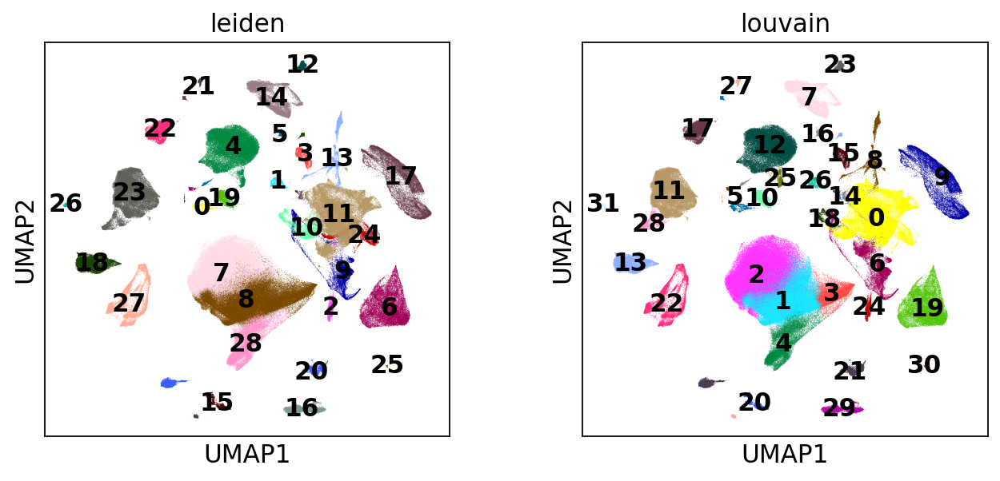

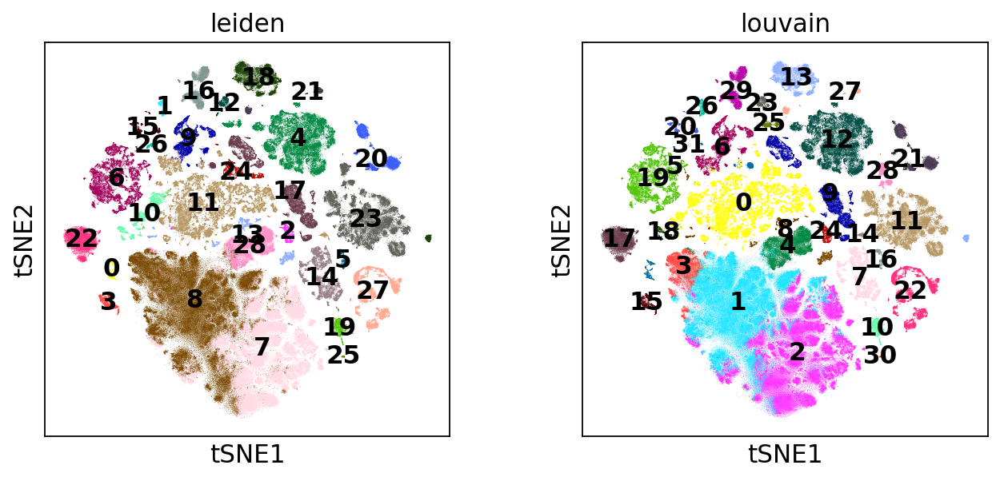

In [200]:
sc.pl.umap(adata, color=["leiden", "louvain"], legend_loc="on data")
sc.pl.tsne(adata, color=["leiden", "louvain"], legend_loc="on data")

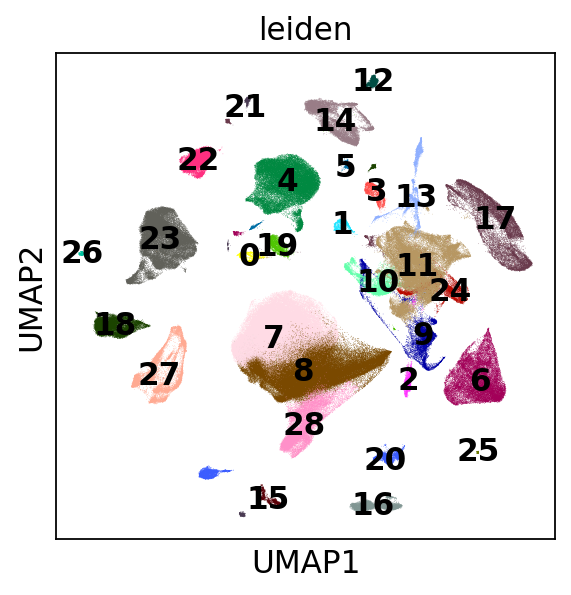

In [201]:
sc.pl.umap(adata, color=["leiden"], legend_loc="on data", use_raw=False, color_map='Reds')

In [202]:
adata.write(results_file)

### UMAP and TSNE with Kmeans

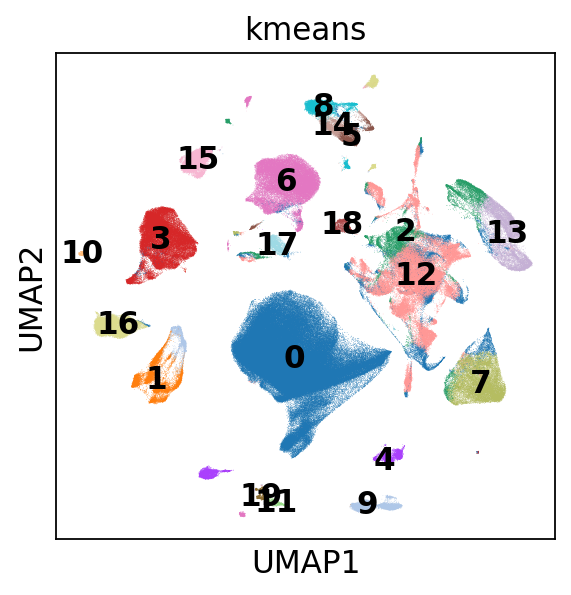

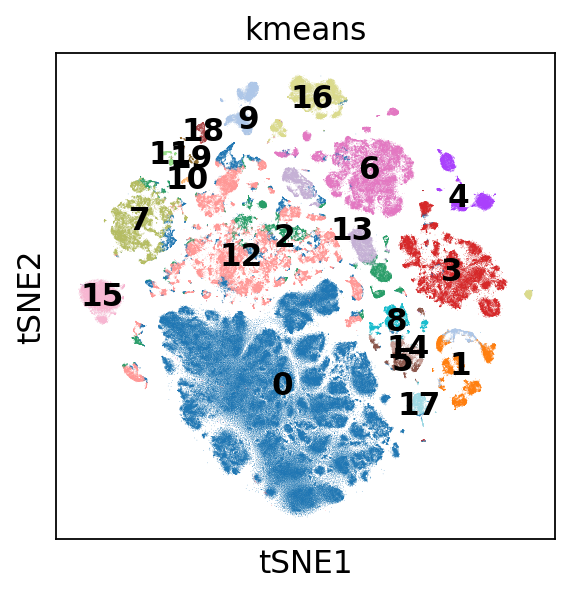

In [203]:
rsc.tl.kmeans(adata, n_clusters=20)

sc.pl.umap(adata, color=["kmeans"], legend_loc = 'on data')
sc.pl.tsne(adata, color=["kmeans"], legend_loc = 'on data')

### Embedding density in the UMAP

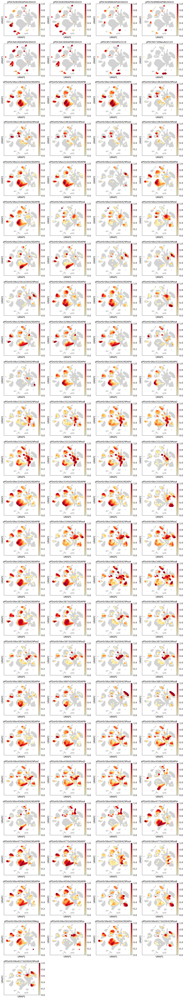

In [204]:
rsc.tl.embedding_density(adata, groupby="patient")
sc.pl.embedding_density(adata, groupby="patient")

## **DE analysis**

[W] [15:13:32.207864] L-BFGS: max iterations reached
[W] [15:13:32.210112] Maximum iterations reached before solver is converged. To increase model accuracy you can increase the number of iterations (max_iter) or improve the scaling of the input data.


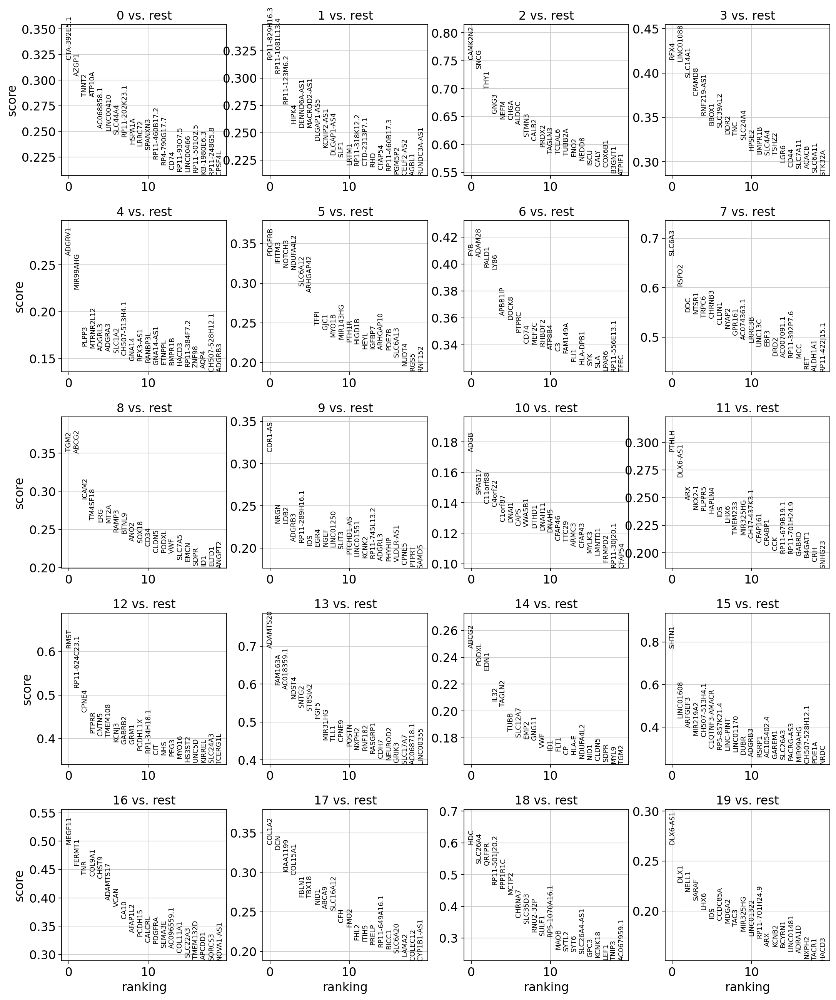

In [205]:
# Methods can be 't-test', 't-test_overestim_var' for overreestimates varience of each group
# 'wilcoxon' for rank-sum
# 'logreg' for logistic regression

rsc.tl.rank_genes_groups_logreg(adata, groupby="kmeans", use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, ncols=4)

In [206]:
sc.settings.verbosity = 2  # reduce the verbosity
adata.write(results_file)

In [207]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="wilcoxon")
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [208]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="logreg", max_iter=1000)
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [209]:
merged_adata = sc.read(results_file)

In [210]:
pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,CTA-392E5.1,RP11-829H16.3,CAMK2N2,RFX4,ADGRV1,PDGFRB,FYB,SLC6A3,TGM2,CDR1-AS,ADGB,PTHLH,RMST,ADAMTS20,ABCG2,SHTN1,MEGF11,COL1A2,HDC,DLX6-AS1
1,AZGP1,RP11-1081L13.4,SNCG,LINC01088,MIR99AHG,IFITM3,ADAM28,RSPO2,ABCG2,NRGN,SPAG17,DLX6-AS1,RP11-624C23.1,FAM163A,PODXL,LINC01608,FERMT1,DCN,SLC26A4,DLX1
2,TNNT2,RP11-123M6.2,THY1,SLC14A1,PLPP3,NOTCH3,PALD1,DDC,ICAM2,LDB2,C11orf88,ARX,CPNE4,AC018359.1,EDN1,ARFGEF3,TNR,KIAA1199,QRFPR,NELL1
3,ATP10A,HIPK4,GNG3,CPAMD8,MTRNR2L12,NDUFA4L2,LY86,NTSR1,TM4SF18,ADGRB3,C4orf22,NKX2-1,PTPRR,NDST4,IL32,MIR219A2,COL9A1,COL15A1,RP11-501J20.2,SARAF
4,AC068858.1,DENND6A-AS1,NEFM,RNF219-AS1,ADGRL3,SLC6A12,APBB1IP,TRPC6,ERG,RP11-289H16.1,C1orf87,PLPPR5,CNTN5,SNTG2,TAGLN2,CH507-513H4.1,CHST9,FBLN1,PPP1R1C,LHX6
5,LINC00410,MACROD2-AS1,CHGA,BBOX1,ADGRA3,ARHGAP42,DOCK8,CHRNB3,MT2A,IDS,DNAI1,HAPLN4,TMEM108,ST8SIA2,TUBB,C1QTNF3-AMACR,ADAMTS17,TBX18,MCTP2,IDS
6,SLC44A4,DLGAP1-AS5,ALDOC,SLC39A12,SLC1A2,TFPI,PTPRC,CLDN1,RAMP3,EGR4,CAPS,IDS,KCNJ3,FGF5,SLC12A7,RP5-857K21.4,VCAN,NID1,CHRNA7,CCDC85A
7,RP11-202K23.1,KCNIP2-AS1,STMN3,DDR2,CH507-513H4.1,GJC1,CD74,NYAP2,BTNL9,NGEF,VWA5B1,LHX6,GABRB2,MIR31HG,EMP2,LINC-PINT,CA10,ABCA9,SLC35D3,MDGA2
8,HSPA1A,DLGAP1-AS4,CALB2,TNC,GNA14,MYO1B,MEF2C,GPR161,ANO2,LINC01250,DTHD1,TMEM233,GRM1,TLL1,GNG11,LINC01170,AFAP1L2,SLC16A12,RNU2-32P,TAC3
9,LRRC72,SLF1,PRDX2,SLC24A4,RFX3-AS1,MIR143HG,RHBDF2,AC074363.1,SOX18,SLIT3,DNAH11,MIR325HG,PCDH11X,CPNE9,VWF,DUBR,PCDH15,CFH,SULF1,MIR325HG


In [211]:
adata.uns

OrderedDict([('log1p', {'base': None}),
             ('hvg', {'flavor': 'seurat_v3'}),
             ('pca',
              {'params': {'zero_center': True, 'use_highly_variable': True},
               'variance': array([137.7848   ,  84.779686 ,  77.60763  ,  72.34461  ,  59.61287  ,
                       49.650417 ,  33.80006  ,  24.253603 ,  20.991816 ,  20.316147 ,
                       17.984077 ,  13.008017 ,  11.01447  ,   9.830831 ,   9.346743 ,
                        9.181325 ,   8.020105 ,   7.4738045,   7.052204 ,   6.5223484,
                        6.0706   ,   5.873383 ,   5.6414766,   5.156761 ,   4.747577 ,
                        4.52325  ,   4.4173765,   4.340954 ,   4.039759 ,   3.905044 ,
                        3.6273978,   3.4812992,   3.3313925,   3.070852 ,   3.0489912,
                        2.9498386,   2.8822074,   2.8471932,   2.8430526,   2.7142527,
                        2.6858037,   2.673349 ,   2.6477897,   2.5066745,   2.4388936,
                    

In [212]:
#result = adata.uns["rank_genes_groups"]
#groups = result["names"].dtype.names
#pd.DataFrame(
#    {
#        group + "_" + key[:1]: result[key][group]
#        for group in groups
#        for key in ["names", "pvals"]
#    }
#).head(10)

ranking genes
    finished (0:00:43)


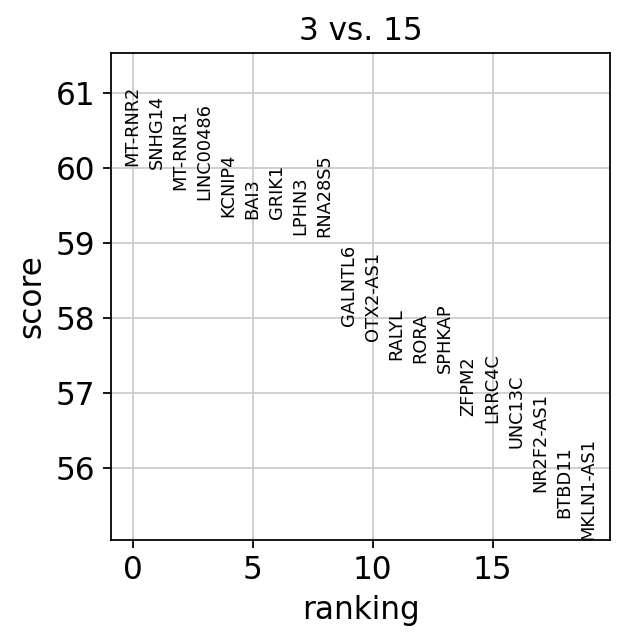

In [213]:
sc.tl.rank_genes_groups(merged_adata, "leiden", groups=["3"], reference="15", method="wilcoxon")
sc.pl.rank_genes_groups(merged_adata, groups=["3"], n_genes=20)

In [214]:
#merged_adata = sc.read(results_file)

In [215]:
#sc.pl.rank_genes_groups_violin(merged_adata, groups="3", n_genes=8)

In [216]:
#sc.pl.violin(merged_adata, ["C3", "P2RY12"], groupby= "leiden", use_raw=False)

In [217]:
adata.write(results_file)

## **Find Marker**

In [218]:
import decoupler as dc

In [219]:
markers = dc.get_resource('PanglaoDB')
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
0,CTRB1,False,Enterocytes,Endoderm,True,0.000000,0.004394,True,0.003311,0.020480,9606,GI tract,0.017
1,CTRB1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,KLK1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
3,KLK1,False,Goblet cells,Endoderm,True,0.588235,0.005039,True,0.903226,0.012408,9606,GI tract,0.013
4,KLK1,False,Epithelial cells,Mesoderm,True,0.000000,0.008233,True,0.225806,0.013758,9606,Epithelium,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,SLC14A1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,UPK3A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,UPK1A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,UPK2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [220]:
# Filter by canonical_marker and human
markers = markers[markers['human'] & 
                  markers['canonical_marker'] & 
                  (markers['organ'] == 'Brain')] #&
                  #(markers['human_sensitivity'] > 0.5)]

# Remove duplicated entries
markers = markers[~markers.duplicated(['cell_type', 'genesymbol'])]
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
91,RARRES2,True,Ependymal cells,Ectoderm,True,0.0,0.078782,True,0.000000,0.000000,9606,Brain,0.030
117,CEBPA,True,Microglia,Ectoderm,True,0.0,0.000000,True,0.193182,0.025223,9606,Brain,0.025
125,EGFR,True,Bergmann glia,Ectoderm,True,0.0,0.022243,True,0.000000,0.012771,9606,Brain,0.014
126,EGFR,True,Neuroblasts,Ectoderm,True,0.0,0.022243,True,0.000000,0.012769,9606,Brain,0.014
172,WT1,True,Neuroblasts,Ectoderm,True,0.0,0.022556,True,0.000000,0.000000,9606,Brain,0.010
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8342,COL23A1,True,Tanycytes,Ectoderm,True,0.0,0.000000,True,0.952381,0.004755,9606,Brain,0.005
8343,LHX2,True,Tanycytes,Ectoderm,True,0.0,0.005326,True,0.047619,0.114045,9606,Brain,0.092
8344,COL25A1,True,Tanycytes,Ectoderm,True,0.0,0.010338,True,0.380952,0.007003,9606,Brain,0.008
8399,VAMP1,True,Trigeminal neurons,Ectoderm,True,0.0,0.000000,True,0.000000,0.000000,9606,Brain,0.003


In [221]:
dc.run_ora(
    mat=adata,
    net=markers,
    source='cell_type',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

Running ora on mat with 433186 samples and 3000 targets for 31 sources.


100%|██████████| 433186/433186 [05:30<00:00, 1309.85it/s]


In [222]:
adata.obsm['ora_estimate'].shape

(433186, 31)

In [223]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e
acts

AnnData object with n_obs × n_vars = 433186 × 31
    obs: 'patient', 'status', 'age', 'sex', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_patient'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'tsne', 'leiden', 'louvain', 'leiden_colors', 'louvain_colors', 'kmeans_colors', 'umap_density_patient_params', 'rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_tsne', 'ora_estimate', 'ora_pvals'

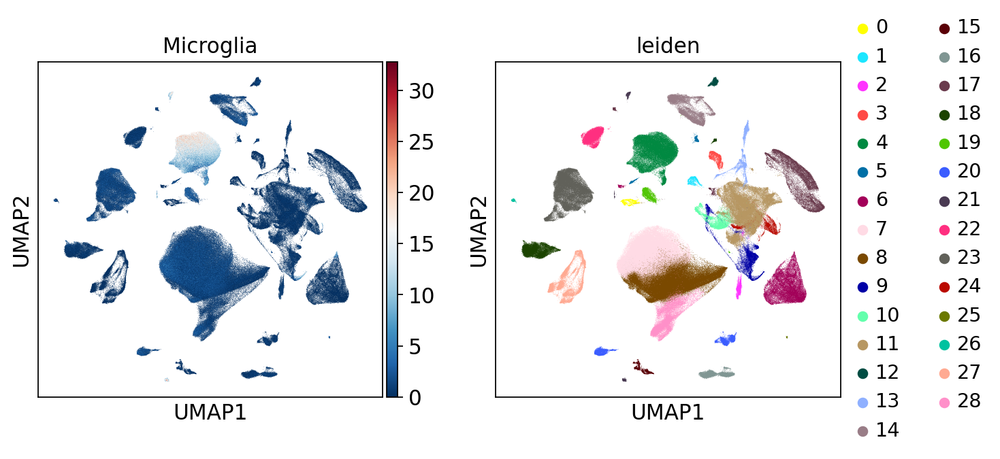

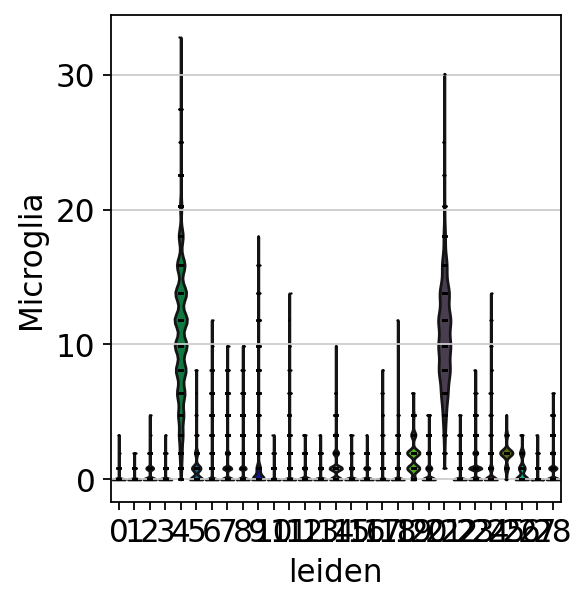

In [234]:
sc.pl.umap(acts, color=['Microglia', 'leiden'], cmap='RdBu_r')
sc.pl.violin(acts, keys=['Microglia'], groupby='leiden')

In [225]:
adata_marker_df = dc.rank_sources_groups(acts, groupby='leiden', reference='rest', method='t-test_overestim_var')
adata_marker_df

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Ependymal cells,29.057125,1.167950,6.286090e-161,1.948688e-159
1,0,rest,Cajal-Retzius cells,27.258952,1.098837,3.116082e-142,3.219952e-141
2,0,rest,GABAergic neurons,27.190811,1.296283,4.644731e-143,7.199333e-142
3,0,rest,Neuroblasts,22.323912,1.064900,1.048973e-100,8.129542e-100
4,0,rest,Neuroendocrine cells,21.579827,0.802668,6.089234e-92,3.775325e-91
...,...,...,...,...,...,...,...
894,9,rest,Purkinje neurons,-27.301332,-0.311998,1.787658e-159,6.157490e-159
895,9,rest,Oligodendrocyte progenitor cells,-31.419289,-0.586678,5.645469e-207,2.500136e-206
896,9,rest,Astrocytes,-34.394042,-1.163869,3.417606e-246,1.765763e-245
897,9,rest,Radial glia cells,-38.409829,-0.416048,5.576687e-305,4.321933e-304


In [226]:
n_ctypes = 3
ctypes_dict = adata_marker_df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ctypes_dict

{'0': ['Ependymal cells', 'Cajal-Retzius cells', 'GABAergic neurons'],
 '1': ['Neuroblasts', 'GABAergic neurons', 'Serotonergic neurons'],
 '10': ['Pyramidal cells', 'Interneurons', 'Tanycytes'],
 '11': ['Interneurons', 'Purkinje neurons', 'GABAergic neurons'],
 '12': ['Oligodendrocyte progenitor cells', 'Tanycytes', 'Meningeal cells'],
 '13': ['Choroid plexus cells', 'Tanycytes', 'Interneurons'],
 '14': ['Meningeal cells', 'Radial glia cells', 'Bergmann glia'],
 '15': ['Interneurons', 'GABAergic neurons', 'Purkinje neurons'],
 '16': ['Purkinje neurons', 'Tanycytes', 'Pyramidal cells'],
 '17': ['Neurons', 'Immature neurons', 'Schwann cells'],
 '18': ['Oligodendrocyte progenitor cells', 'Meningeal cells', 'Tanycytes'],
 '19': ['Meningeal cells', 'Retinal ganglion cells', 'Choroid plexus cells'],
 '2': ['Cajal-Retzius cells', 'Interneurons', 'Pyramidal cells'],
 '20': ['Astrocytes', 'Bergmann glia', 'Ependymal cells'],
 '21': ['Microglia', 'Neuroendocrine cells', 'Satellite glial cells']

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


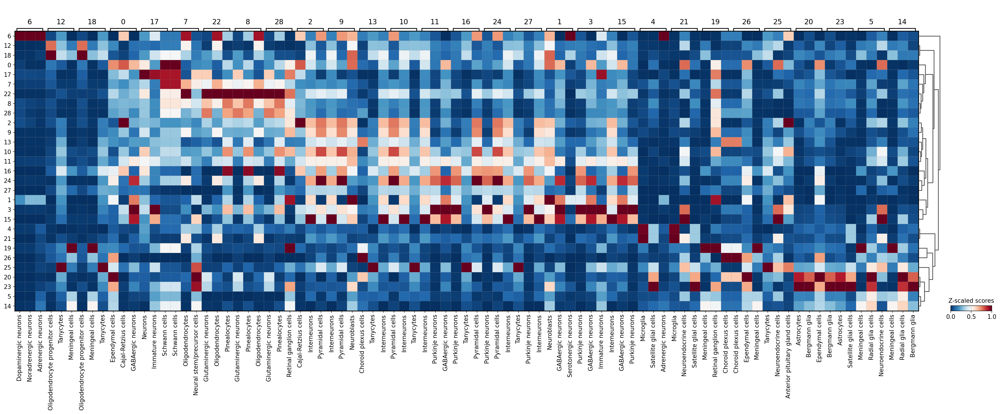

In [227]:
sc.pl.matrixplot(acts, ctypes_dict, 'leiden', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

In [228]:
annotation_dict = adata_marker_df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'Ependymal cells',
 '1': 'Neuroblasts',
 '10': 'Pyramidal cells',
 '11': 'Interneurons',
 '12': 'Oligodendrocyte progenitor cells',
 '13': 'Choroid plexus cells',
 '14': 'Meningeal cells',
 '15': 'Interneurons',
 '16': 'Purkinje neurons',
 '17': 'Neurons',
 '18': 'Oligodendrocyte progenitor cells',
 '19': 'Meningeal cells',
 '2': 'Cajal-Retzius cells',
 '20': 'Astrocytes',
 '21': 'Microglia',
 '22': 'Glutaminergic neurons',
 '23': 'Bergmann glia',
 '24': 'Purkinje neurons',
 '25': 'Tanycytes',
 '26': 'Choroid plexus cells',
 '27': 'Tanycytes',
 '28': 'Glutaminergic neurons',
 '3': 'Purkinje neurons',
 '4': 'Microglia',
 '5': 'Meningeal cells',
 '6': 'Dopaminergic neurons',
 '7': 'Schwann cells',
 '8': 'Glutaminergic neurons',
 '9': 'Interneurons'}

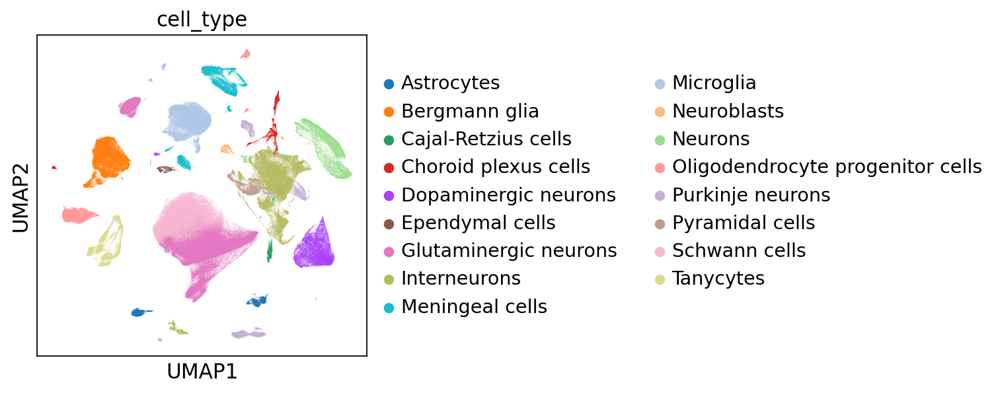

In [229]:
adata.obs['cell_type'] = [annotation_dict[clust] for clust in adata.obs['leiden']]

sc.pl.umap(adata, color='cell_type')

## **Pseudobulking pyDeseq2**

In [230]:
adata.X

array([[ 1.6151446 , -0.52614486, -0.2418053 , ..., -0.1387182 ,
        -0.00837982, -0.00803734],
       [ 1.405424  ,  0.04841086, -0.27324158, ..., -0.138668  ,
        -0.00857786, -0.00812165],
       [ 2.2296255 , -0.37355602, -0.25254938, ..., -0.03780828,
        -0.00413578, -0.0043266 ],
       ...,
       [-0.578538  , -0.5950162 , -0.59821004, ...,  0.00644001,
        -0.00444596, -0.00363398],
       [-0.57246745, -0.58256805, -0.5833542 , ...,  0.00636715,
        -0.00435447, -0.00359596],
       [-0.5819945 , -0.6073248 , -0.62297016, ...,  0.01182832,
        -0.00437336, -0.00350213]], dtype=float32)

In [235]:
adata.layers['counts']

<433186x3000 sparse matrix of type '<class 'numpy.float32'>'
	with 138752934 stored elements in Compressed Sparse Column format>

In [236]:
import pydeseq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
import random

In [334]:
cluster_subset = adata[adata.obs['cell_type'] == 'Neurons', :].copy()
cluster_subset

AnnData object with n_obs × n_vars = 18407 × 3000
    obs: 'patient', 'status', 'age', 'sex', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_patient', 'cell_type'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'tsne', 'leiden', 'louvain', 'leiden_colors', 'louvain_colors', 'kmeans_colors', 'umap_density_patient_params', 'rank_genes_groups', 'dendrogram_leiden', 'cell_type_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_tsne', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [335]:
list(dict.fromkeys(cluster_subset.obs['status']))

['Ctrl', 'PD', 'LBD']

In [336]:
cluster_subset_PD_CTL = cluster_subset[cluster_subset.obs['status'].isin(['PD', 'Ctrl'])].copy()
cluster_subset_PD_LBD = cluster_subset[cluster_subset.obs['status'].isin(['PD', 'LBD'])].copy()
cluster_subset_LBD_CTL = cluster_subset[cluster_subset.obs['status'].isin(['LBD', 'Ctrl'])].copy()

In [337]:
cluster_subset_PD_CTL.obs['status']

Barcode
TGCTTCGGTGACTGTT-1    Ctrl
TTCGATTTCTCTGGTC-1    Ctrl
CGGAATTGTCCTGGGT-1    Ctrl
CAATACGGTATTGACC-1    Ctrl
ACAACCATCATGCCAA-1    Ctrl
                      ... 
GACTGATAGAATGTTG-1      PD
TTGCTGCGTTCGATTG-1      PD
AAGCGAGTCGGCATTA-1      PD
ACTATCTGTTGCTCGG-1      PD
TAACGACGTCTTGAGT-1      PD
Name: status, Length: 16525, dtype: category
Categories (2, object): ['Ctrl', 'PD']

In [338]:
pbs_pd_ctl = []
pbs_pd_lbd = []
pbs_lbd_ctl = []

In [339]:
def process_subset(subset, pbs_list):
    
    for patient in subset.obs.patient.unique():
    
        subset_patient = subset[subset.obs['patient'] == patient, :].copy()
        subset_patient.X = subset_patient.layers['counts'] #change to raw counts using array

        rep_adata = sc.AnnData(X = subset_patient.X.sum(axis=0),
                               var=subset_patient.var[[]])
    
        rep_adata.obs_names = [patient]
        rep_adata.obs['status'] = subset_patient.obs['status'].iloc[0]
        rep_adata.obs['patient'] = subset_patient.obs['patient'].iloc[0]

        pbs_list.append(rep_adata)

In [340]:
process_subset(cluster_subset_PD_CTL, pbs_pd_ctl)
process_subset(cluster_subset_PD_LBD, pbs_pd_lbd)
process_subset(cluster_subset_LBD_CTL, pbs_lbd_ctl)

In [341]:
pbs_lbd_ctl

[AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status', 'patient',
 AnnData object with n_obs × n_vars = 1 × 3000
     obs: 'status

In [342]:
pb_1 = sc.concat(pbs_pd_ctl)
pb_2 = sc.concat(pbs_pd_lbd)
pb_3 = sc.concat(pbs_lbd_ctl)

In [343]:
pb_1.var

""
Gene_symbol
RP5-857K21.4
HES4
ISG15
GABRD
HES5
...
RN7SL42P
snoR26
RN7SL494P


In [344]:
datasets = [pb_1, pb_2, pb_3]
counts_data = []
dds_data = []

for i, pb, in enumerate(datasets, start=1):
    
    pb.var['Gene_symbol'] = pb.var_names.values
    counts = pd.DataFrame(pb.X, columns=pb.var['Gene_symbol']).set_index([pb.obs['patient']])
    globals()[f'counts_{i}'] = counts
    counts_data.append(counts)

#Change index of counts to 1-6, instead of 0-5
counts_dict = {}
for i, counts in enumerate(counts_data, start=1):
    counts_dict[i] = counts

In [345]:
counts_dict

{1: Gene_symbol                  RP5-857K21.4    HES4   ISG15   GABRD  HES5  \
 patient                                                                   
 pPDsHSrSNxi3482d200429PosB         1330.0   295.0   176.0   541.0  12.0   
 pPDsHSrSNxi3346d200429PosB         6187.0   765.0   355.0  1256.0  13.0   
 pPDsHSrSNxi3482d200429PosA          869.0   194.0   111.0   348.0   4.0   
 pPDsHSrSNxi3346d200429PosC         4034.0   653.0   292.0   998.0  19.0   
 pPDsHSrSNxi3873d200429PosA          626.0   106.0    92.0   229.0   3.0   
 pPDsHSrSNxi5610d200429Pos          1313.0   858.0  1506.0  2914.0  26.0   
 pPDsHSrSNxi3873d200429PosE          308.0    32.0    59.0   120.0   3.0   
 pPDsHSrSNxi3322d200429PosG            2.0     0.0     0.0     0.0   0.0   
 pPDsHSrSNxi3873d200429PosF          236.0    41.0    31.0   105.0   0.0   
 pPDsHSrSNxi3322d200429PosE            3.0     0.0     0.0     0.0   0.0   
 pPDsHSrSNxi3346d200429PosA         3126.0   479.0   249.0   870.0   8.0   
 pPDsHSrS

In [346]:
dds_data = []

for i, pb in enumerate(datasets, start=1):
    dds = DeseqDataSet(counts=counts_dict[i],
                       metadata = pb.obs,
                       design_factors=['status'])
    
    globals()[f'dds_{i}'] = dds
    dds_data.append(dds)
    
    
dds_dict = {}
for i, dds in enumerate(dds_data, start=1):
    dds_dict[i] = dds

In [347]:
dds_dict

{1: AnnData object with n_obs × n_vars = 48 × 3000
     obs: 'status', 'patient'
     obsm: 'design_matrix',
 2: AnnData object with n_obs × n_vars = 35 × 3000
     obs: 'status', 'patient'
     obsm: 'design_matrix',
 3: AnnData object with n_obs × n_vars = 41 × 3000
     obs: 'status', 'patient'
     obsm: 'design_matrix'}

In [348]:
def deseq2_analyse(dds):
    sc.pp.filter_genes(dds, min_cells=1)
    dds.deseq2()
    sc.tl.pca(dds)
    sc.pl.pca(dds, color='status', size = 200)

filtered out 277 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 41.86 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 28.13 seconds.

Fitting LFCs...
... done in 9.90 seconds.

Replacing 8 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...


computing PCA
    with n_comps=47
    finished (0:00:00)


... done in 0.06 seconds.



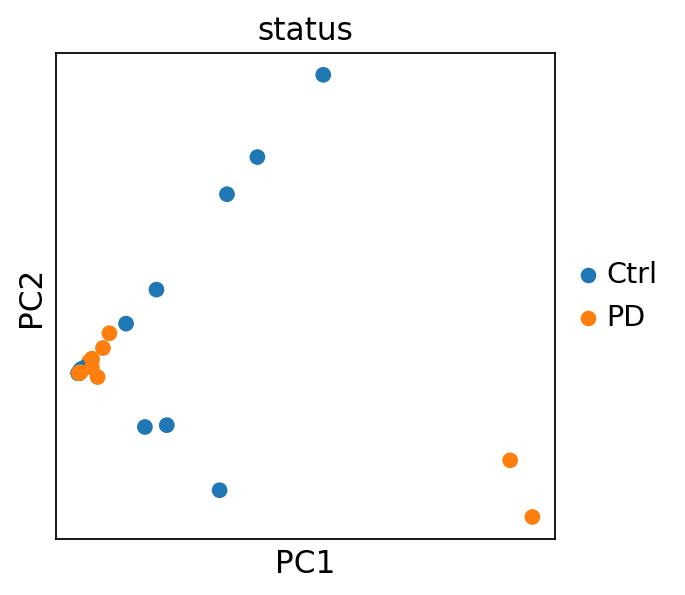

filtered out 298 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 8.26 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 6.40 seconds.

Fitting LFCs...
... done in 7.84 seconds.

Replacing 19 outlier genes.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...


computing PCA
    with n_comps=34
    finished (0:00:00)


... done in 0.07 seconds.

Fitting LFCs...
... done in 0.09 seconds.



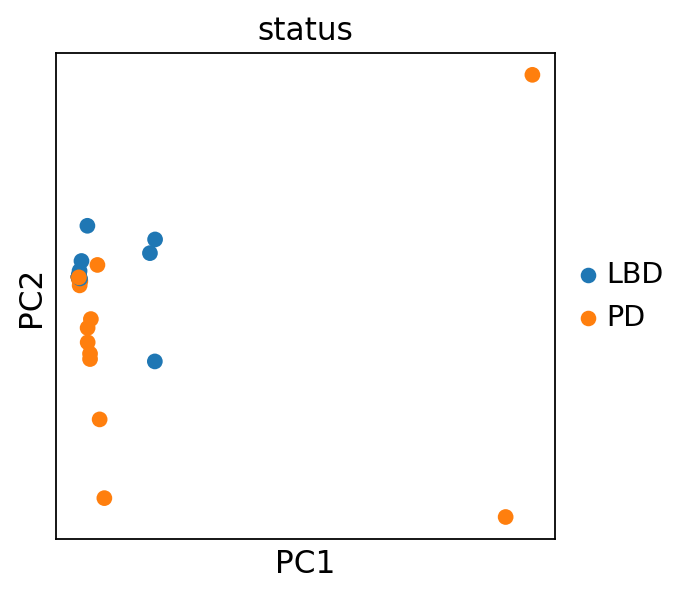

filtered out 290 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 6.87 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 6.35 seconds.

Fitting LFCs...
... done in 7.54 seconds.

Replacing 19 outlier genes.

Fitting dispersions...
... done in 0.07 seconds.

Fitting MAP dispersions...


computing PCA
    with n_comps=40
    finished (0:00:00)


... done in 0.07 seconds.

Fitting LFCs...
... done in 0.06 seconds.



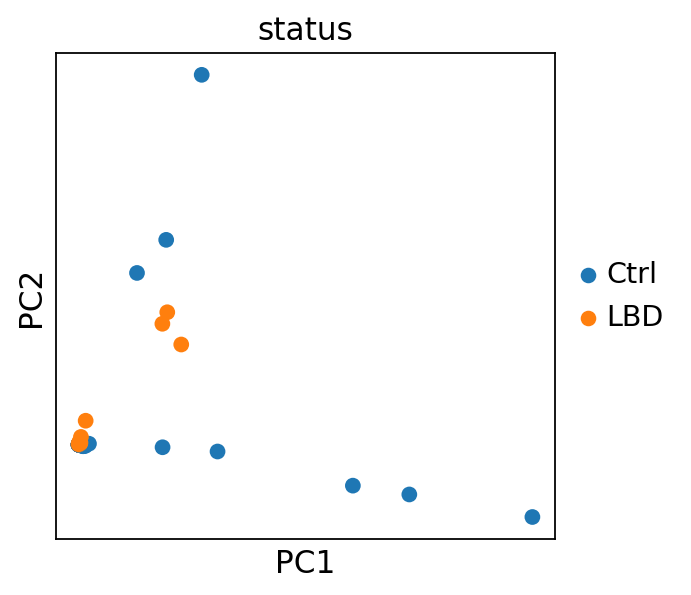

In [349]:
for i in range(1, 4):
    
    dds = dds_dict[i]
    deseq2_analyse(dds)

In [350]:
contrasts = [('status', 'PD', 'Ctrl'), 
             ('status', 'PD', 'LBD'), 
             ('status', 'LBD', 'Ctrl')]

start_res_data = []

for i, dds in dds_dict.items():
    contrast = contrasts[i-1]  # Adjusting index since keys start from 1
    start_res = DeseqStats(dds, contrast=contrast)
    
    globals()[f'start_res_{i}'] = start_res
    start_res_data.append(start_res)
    
    
start_res_dict = {}

for i, start_res in enumerate(start_res_data, start=1):
    start_res_dict[i] = start_res

In [351]:
for i in range(1, 4):
    start_res_dict[i].summary()

Running Wald tests...
... done in 1.24 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: status PD vs Ctrl
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Gene_symbol                                                             
RP5-857K21.4  29.379163       -0.546706  0.458243 -1.193048  0.232851   
HES4           8.742673       -0.501000  0.266289 -1.881414  0.059916   
ISG15          6.831434        0.352412  0.347760  1.013376  0.310881   
GABRD         13.367559       -0.386210  0.324751 -1.189251  0.234341   
HES5           0.532076       -1.313141  0.573863 -2.288247  0.022123   
...                 ...             ...       ...       ...       ...   
VTRNA1-3      10.940540       -0.779408  0.427984 -1.821115  0.068589   
WDR96         11.100669       -0.782170  0.461644 -1.694314  0.090206   
hsa-mir-490   13.930296       -0.617446  0.349883 -1.764721  0.077611   
RN7SL42P       0.000980       -1.056315  1.469995 -0.718584  0.472397   
RNU2-36P       0.000041       -1.075439  1.446928 -0.743257  0.45732

... done in 1.25 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: status PD vs LBD
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Gene_symbol                                                             
RP5-857K21.4  32.387035        1.088599  0.554448  1.963392  0.049601   
HES4          10.435316       -0.162405  0.423204 -0.383751  0.701163   
ISG15         10.336948        0.276310  0.433816  0.636930  0.524171   
GABRD         11.514231        1.520949  0.610977  2.489371  0.012797   
HES5           0.240810        0.526415  0.648578  0.811645  0.416995   
...                 ...             ...       ...       ...       ...   
VTRNA1-3      10.324083        0.843750  0.388227  2.173339  0.029755   
WDR96         13.809957        0.547013  0.502049  1.089561  0.275907   
hsa-mir-490   15.281913        1.793725  0.450053  3.985589  0.000067   
RN7SL42P       0.001966        0.996758  1.992641  0.500220  0.616920   
RNU2-36P       0.000082        0.976157  1.957962  0.498558  0.618091

... done in 1.33 seconds.



In [352]:
start_res_dict[3].summary()

Log2 fold change & Wald test p-value: status LBD vs Ctrl
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
Gene_symbol                                                                 
RP5-857K21.4  26.592012       -1.806055  0.420519 -4.294821  1.748344e-05   
HES4          10.091345       -0.431051  0.378197 -1.139755  2.543886e-01   
ISG15          6.779425       -0.086701  0.477867 -0.181434  8.560273e-01   
GABRD         13.051115       -1.961659  0.504048 -3.891811  9.949880e-05   
HES5           0.589339       -1.955365  0.718956 -2.719727  6.533587e-03   
...                 ...             ...       ...       ...           ...   
TRHDE-AS1      0.175215       -0.713187  0.982870 -0.725617  4.680736e-01   
VTRNA1-2       0.006338       -1.904371  1.569514 -1.213350  2.249959e-01   
VTRNA1-3      10.621620       -1.831005  0.533574 -3.431584  6.000676e-04   
WDR96          8.286443       -1.427682  0.564939 -2.527146  1.149938e-02   
hsa-mir-490    9.93

In [353]:
from sanbomics.tools import id_map

In [354]:
de_data = []
sigs_data = []

for i, start_res in start_res_dict.items():
    de = start_res_dict[i].results_df
    de['gene_symbol'] = de.index
    sigs = de[(de.padj < 0.005) & (abs(de.log2FoldChange) > 0.5)]
    
    globals()[f'de_{i}'] = de
    globals()[f'sigs_{i}'] = sigs
    
    de_data.append(de)
    sigs_data.append(sigs)
    
    
de_data_dict = {}
sigs_data_dict = {}

for i, de in enumerate(de_data, start=1):
    de_data_dict[i] = de

for i, sigs in enumerate(sigs_data, start=1):
    sigs_data_dict[i] = sigs

In [355]:
dds_sigs_data = []

for i, dds in dds_dict.items():    
    dds_dict[i].layers['log1p'] = np.log1p(dds_dict[i].layers['normed_counts'])
    dds_sigs = dds_dict[i][:, sigs_data_dict[i].index]
    
    
    globals()[f'dds_sigs_{i}'] = dds_sigs
    dds_sigs_data.append(dds_sigs)

dds_sigs_data_dict = {}

for i, dds_sigs in enumerate(dds_sigs_data, start=1):
    dds_sigs_data_dict[i] = dds_sigs

In [356]:
heat_map_data = []
ax_cluster_map = []

for i in range(1,4):
    heat_map = pd.DataFrame(dds_sigs_data_dict[i].layers['log1p'],
                            index=dds_sigs_data_dict[i].obs, 
                            columns=dds_sigs_data_dict[i].var_names)
    heat_map.set_index([dds_sigs_data_dict[i].obs['status'], 
                        dds_sigs_data_dict[i].obs['patient']], 
                       inplace=True)
    heat_map = heat_map.reindex(sorted(heat_map.columns), axis=1)
    heat_map = heat_map.T


    globals()[f'heat_map_{i}'] = heat_map
    
    
    heat_map_data.append(heat_map)
    

heat_map_data_dict = {}

for i, heat_map in enumerate(heat_map_data, start=1):
    heat_map_data_dict[i] = heat_map

In [357]:
heat_map_data_dict[3]

status                            Ctrl                             \
patient     pPDsHSrSNxi3482d200429PosB pPDsHSrSNxi3346d200429PosB   
Gene_symbol                                                         
ABCA10                        4.479815                   4.864384   
ABCA9                         3.922178                   4.330144   
ABCC3                         0.581662                   0.506142   
ABCG2                         2.354595                   2.271189   
ABI3BP                        1.914872                   2.126903   
...                                ...                        ...   
ZNF385B                       6.349506                   6.831909   
ZNF804B                       5.962383                   6.714325   
ZNF98                         1.985021                   2.451419   
ZSWIM4                        1.316048                   1.628153   
hsa-mir-490                   3.500115                   3.473021   

status                                                             \
patient     pPDsHSrSNxi3482d200429PosA pPDsHSrSNxi3346d200429PosC   
Gene_symbol                                                         
ABCA10                        4.497503                   4.731400   
ABCA9                         3.945451                   4.256015   
ABCC3                         0.627644                   0.325690   
ABCG2                         2.252724                   2.161075   
ABI3BP                        1.969475                   2.028477   
...                                ...                        ...   
ZNF385B                       6.340633                   6.726687   
ZNF804B                       5.950794                   6.618801   
ZNF98                         2.229511                   2.412660   
ZSWIM4                        1.359038                   1.461141   
hsa-mir-490                   3.446743                   3.379435   

status                                                            \
patient     pPDsHSrSNxi5610d200429Pos pPDsHSrSNxi3322d200429PosG   
Gene_symbol                                                        
ABCA10                       2.551328                   2.428651   
ABCA9                        2.163559                   0.000000   
ABCC3                        0.221905                   0.000000   
ABCG2                        0.643677                   2.428651   
ABI3BP                       0.483126                   0.000000   
...                               ...                        ...   
ZNF385B                      4.225022                   3.964954   
ZNF804B                      3.604573                   3.076719   
ZNF98                        1.693463                   0.000000   
ZSWIM4                       0.745145                   0.000000   
hsa-mir-490                  3.055776                   0.000000   

status                                                             \
patient     pPDsHSrSNxi3322d200429PosE pPDsHSrSNxi3346d200429PosA   
Gene_symbol                                                         
ABCA10                        2.658497                   4.766653   
ABCA9                         3.315989                   4.181174   
ABCC3                         0.000000                   0.418011   
ABCG2                         2.658497                   2.153964   
ABI3BP                        0.000000                   2.148475   
...                                ...                        ...   
ZNF385B                       0.000000                   6.734390   
ZNF804B                       0.000000                   6.605746   
ZNF98                         0.000000                   2.308351   
ZSWIM4                        0.000000                   1.553273   
hsa-mir-490                   0.000000                   3.312943   

status                                                               ...  \
patient     pPDsHSrSNxi3345d200429DAPIB pPDsHSrSNxi3482d200429DAPIB  .

In [358]:
cluster_pd_ctl = []
cluster_pd_lbd = []
cluster_lbd_ctl = []

def cluster_heat_map(heat_map_value, cluster_list):
    cluster_heat_map = sns.clustermap(heat_map_value, z_score=0, cmap='RdYlBu_r')
    cluster_list.append(cluster_heat_map)

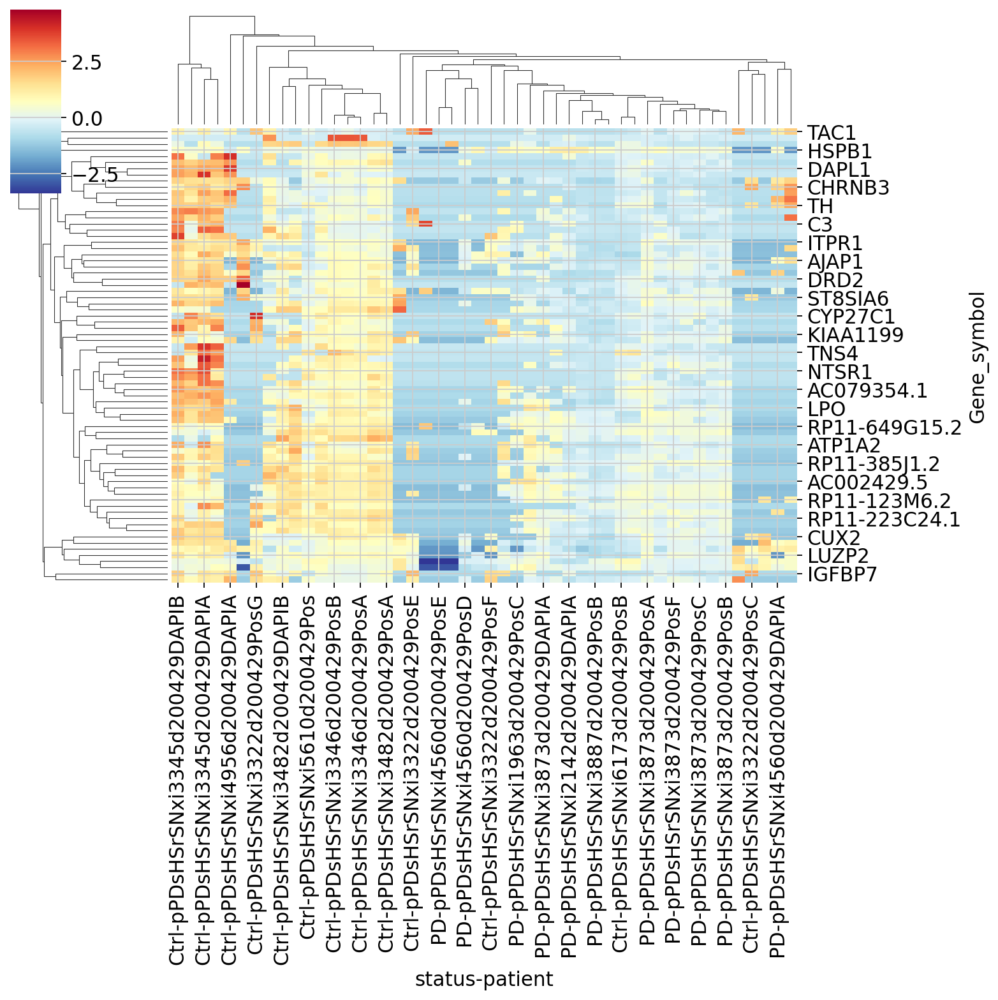

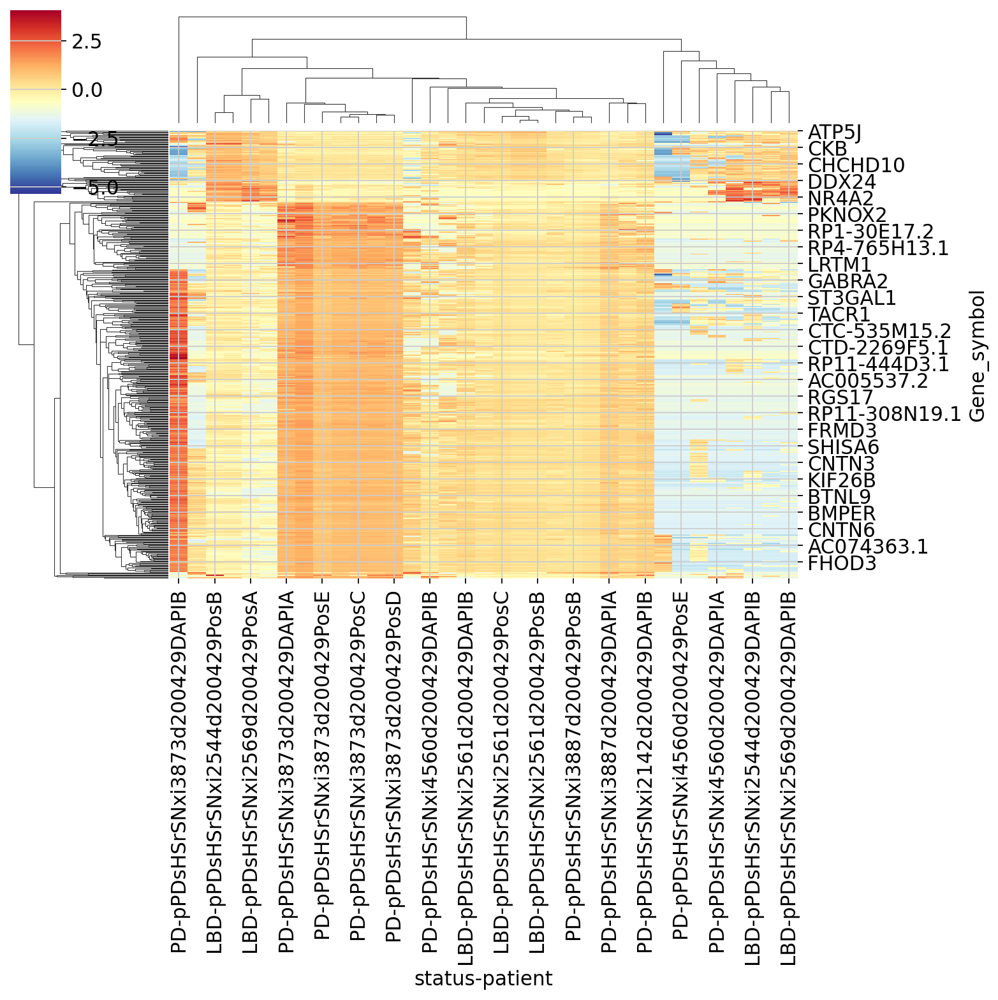

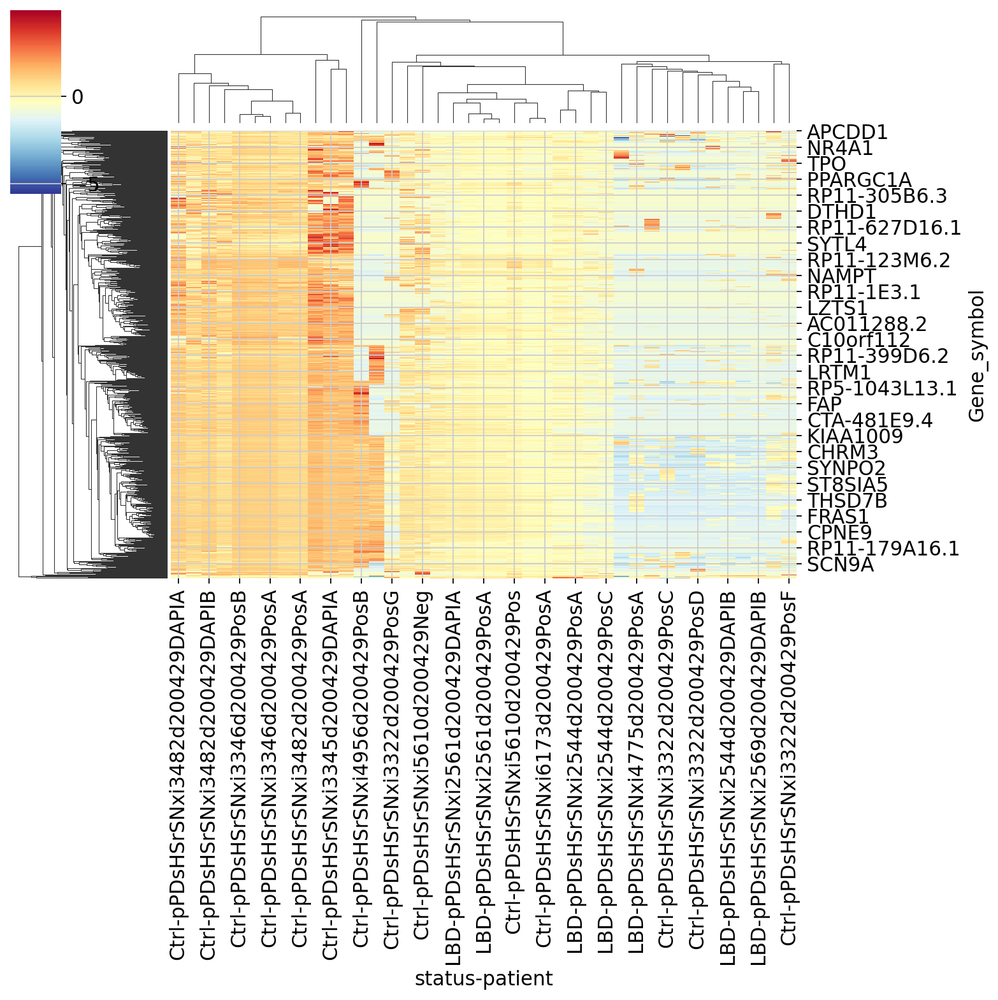

In [359]:
cluster_heat_map(heat_map_data_dict[1], cluster_pd_ctl)
cluster_heat_map(heat_map_data_dict[2], cluster_pd_lbd)
cluster_heat_map(heat_map_data_dict[3], cluster_lbd_ctl)

In [360]:
import sanbomics
from sanbomics.plots import volcano

In [366]:
volcano_pd_ctl = []
volcano_pd_lbd = []
volcano_lbd_ctl = []

def volcano_pseudobulk(de_value, plot_list):
    
    plot = volcano(de_value, 
                    symbol='gene_symbol', 
                    top_right_frame = True,
                    to_label = 10,
                    log2fc_thresh=1.00,
                    pval_thresh=0.05,
                    baseMean='baseMean',
                    figsize=(10,10))
    
    plot_list.append(plot)

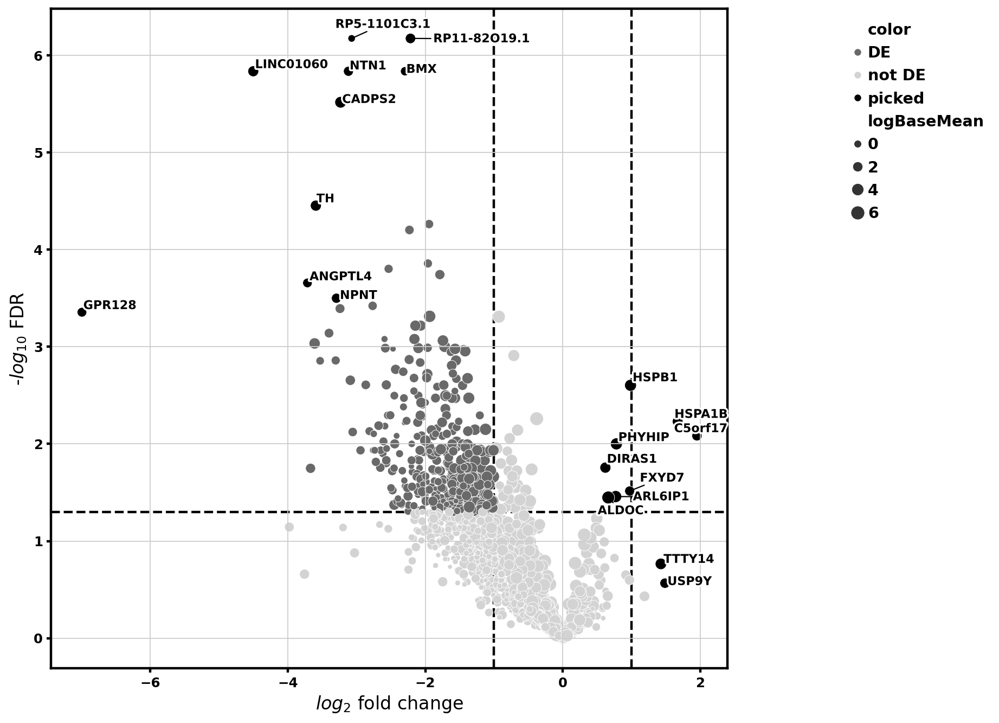

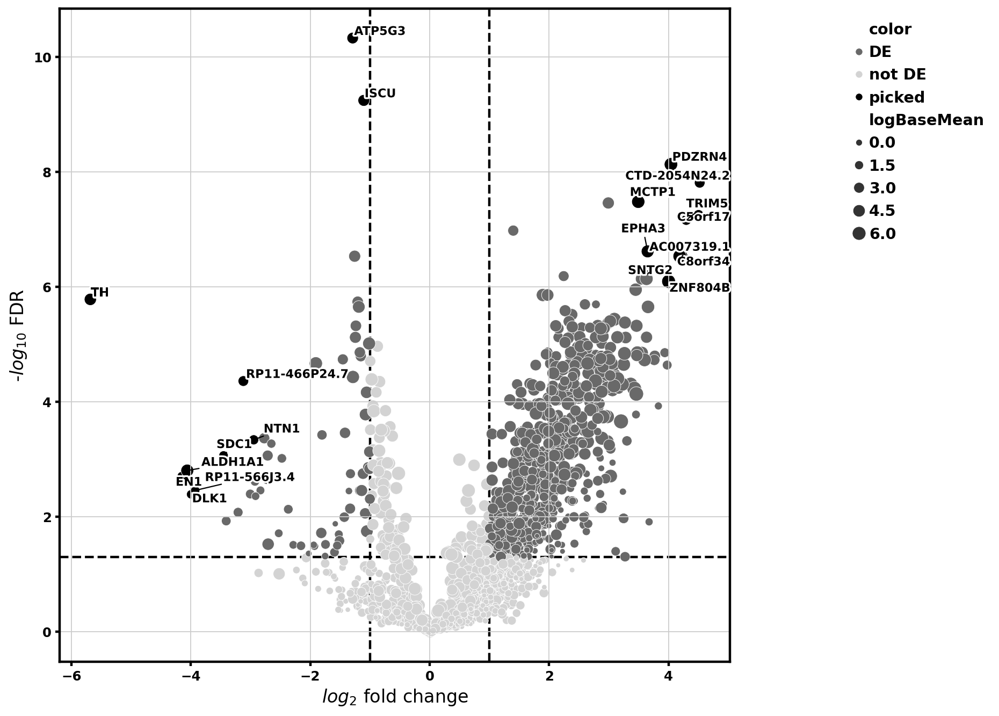

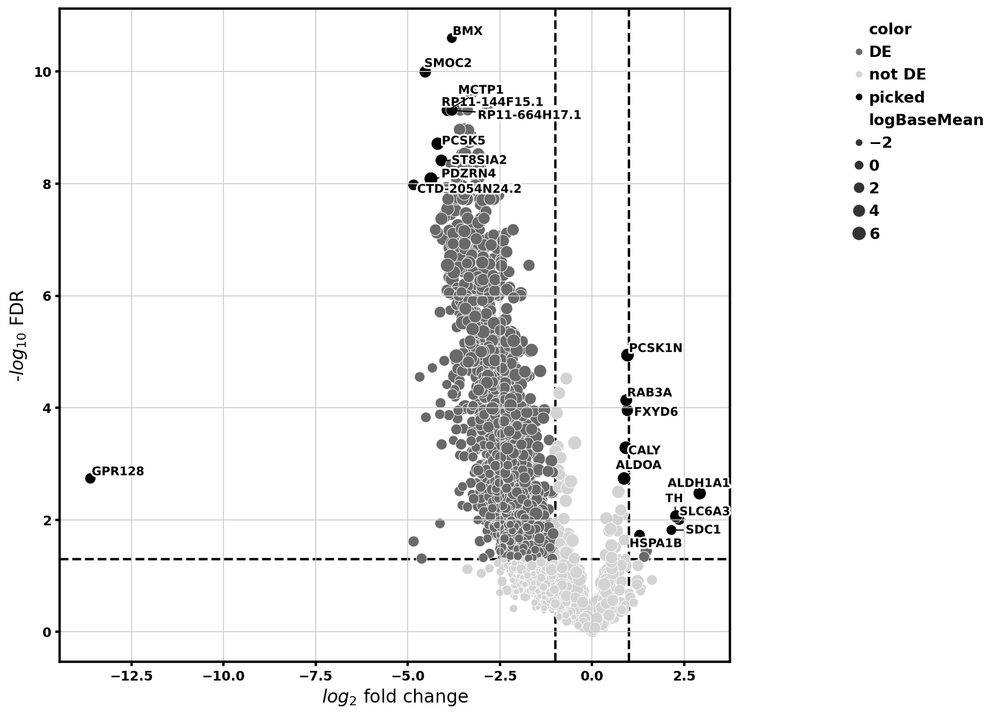

In [367]:
volcano_pseudobulk(de_data_dict[1], volcano_pd_ctl)
volcano_pseudobulk(de_data_dict[2], volcano_pd_lbd)
volcano_pseudobulk(de_data_dict[3], volcano_lbd_ctl)

In [363]:
de_data_dict[1].sort_values('padj', ascending = False)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_symbol
Gene_symbol,,,,,,,
RP11-368L12.1,73.625916,0.002213,0.506748,0.004368,0.996515,0.996515,RP11-368L12.1
ARL4C,32.435570,0.000872,0.188477,0.004627,0.996308,0.996515,ARL4C
CHRM2,183.330821,0.007167,0.543995,0.013174,0.989489,0.990414,CHRM2
CDKN2D,22.472453,0.003422,0.211379,0.016187,0.987085,0.988469,CDKN2D
SCN1B,53.780798,0.004071,0.202413,0.020114,0.983952,0.985793,SCN1B
...,...,...,...,...,...,...,...
SDIM1,0.055532,-1.215624,0.859842,-1.413775,0.157428,NaN,SDIM1
TRHDE-AS1,0.093264,-0.866084,0.842592,-1.027881,0.304006,NaN,TRHDE-AS1
VTRNA1-2,0.007301,-1.063777,1.295235,-0.821300,0.411475,NaN,VTRNA1-2
